<h1><center><font size="25">Exploración de datos de polucion con Python</font></center></h1>

<center><b>Ana Georgina Flesia </b></center>
    
  <center><b>  Basado en una notebook de Boriharn K</b></center>

<center><i>18 de noviembre 2022 </i></center>

# Introducción
<br>

Una gráfica de series de tiempo con una sola línea es un gráfico útil para expresar datos con secuencias largas. Consta de un eje X que representa la línea de tiempo y un eje Y que muestra el valor. Este es un método estándar ya que el concepto es simple y fácil de entender. El gráfico puede ayudarnos a extraer información valiosa, como tendencias y efectos estacionales.

Sin embargo, muchas curvas en el gráfico de series temporales múltiples pueden dificultar las cosas. 

# Datos
<br>

Para trabajar con un ejemplo de caso real, usaré el conjunto de datos Air Pollution in Seoul de Kaggle (enlace). Los datos fueron proporcionados por el Gobierno Metropolitano de Seúl. Se trata de información sobre la contaminación del aire que consiste en SO2, NO2, CO, O3, PM10 y PM2.5 entre 2017 y 2019 de 25 distritos en Seúl, la capital de Corea del Sur.

En este artículo, las PM2.5 de 25 distritos serán la variable principal trazada como múltiples líneas de series de tiempo. PM2.5 se define como una materia de partículas finas con un diámetro inferior a 2,5 µm. Se considera un tipo de contaminación que provoca efectos en la salud a corto plazo.

Visualizar PM2.5 desde muchos lugares ayuda a comparar cómo la contaminación afecta a la ciudad.

# Importar datos
<br>

Empecemos importando librerias

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker

Leer Measurement_summary.csv con Pandas.

In [2]:
df = pd.read_csv('Measurement_summary.csv')
df.head()

,Measurement date,Station code,Address,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5
0,2017-01-01 00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.059,0.002,1.2,73.0,57.0
1,2017-01-01 01:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.058,0.002,1.2,71.0,59.0
2,2017-01-01 02:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,59.0
3,2017-01-01 03:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,58.0
4,2017-01-01 04:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.003,0.051,0.002,1.2,69.0,61.0


Explore Data
Now that we have already imported the dataset. Continue with checking the missing value and the data type of each column.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 647511 entries, 0 to 647510
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Measurement date  647511 non-null  object 
 1   Station code      647511 non-null  int64  
 2   Address           647511 non-null  object 
 3   Latitude          647511 non-null  float64
 4   Longitude         647511 non-null  float64
 5   SO2               647511 non-null  float64
 6   NO2               647511 non-null  float64
 7   O3                647511 non-null  float64
 8   CO                647511 non-null  float64
 9   PM10              647511 non-null  float64
 10  PM2.5             647511 non-null  float64
dtypes: float64(8), int64(1), object(2)
memory usage: 54.3+ MB


La buena noticia es que no falta ningún valor. El siguiente paso es comprobar el número de códigos de estación distintos.

In [4]:
df['Station code'].nunique()

25

Hay 25 estaciones en total. Verifique los códigos de la estación.

In [5]:
list_scode = list(set(df['Station code']))

In [6]:
list_add = list(df['Address'])
District = [i.split(', ')[2] for i in list_add]
df['District'] = District

# Preprocesar los datos
<br>

Del 101 al 125, los códigos de estación representan los distritos de Seúl. Personalmente, usar los nombres de los distritos es más conveniente para etiquetar la visualización, ya que es más conveniente para leer. Los nombres se extraerán de la columna "Dirección" para crear la columna "Distrito".

In [7]:
list_district = list(set(District))

Cree una lista con los nombres de los 25 distritos para usarla más adelante.

In [8]:
list_YM = [i.split(" ")[0][:-3] for i in  list(df['Measurement date'])]
list_Year = [i.split(" ")[0][0:4] for i in  list(df['Measurement date'])]
list_Month = [i.split(" ")[0][5:7] for i in  list(df['Measurement date'])]

df['YM'] = list_YM
df['Year'] = list_Year
df['Month'] = list_Month

#create a monthly dataframe
df_monthly = df.groupby(['Station code', 'District', 'YM', 'Year', 'Month']).mean()
df_monthly = df_monthly[['SO2', 'NO2', 'O3', 'CO', 'PM10', 'PM2.5']].reset_index()

df_monthly.head()

,Station code,District,YM,Year,Month,SO2,NO2,O3,CO,PM10,PM2.5
0,101,Jongno-gu,2017-01,2017,01,0.004401,0.037481,0.014972,0.695968,51.024194,35.118280
1,101,Jongno-gu,2017-02,2017,02,-0.022152,0.010290,-0.008138,0.600000,41.970238,28.857143
2,101,Jongno-gu,2017-03,2017,03,0.005015,0.041267,0.026862,0.698118,55.146505,40.311828
3,101,Jongno-gu,2017-04,2017,04,0.003308,0.034699,0.033512,0.598056,50.769444,26.536111
4,101,Jongno-gu,2017-05,2017,05,0.003461,0.031724,0.039319,0.490591,55.129032,22.680108


# Graficamos 

## 1-.Primero un grafico multivariado de líneas.

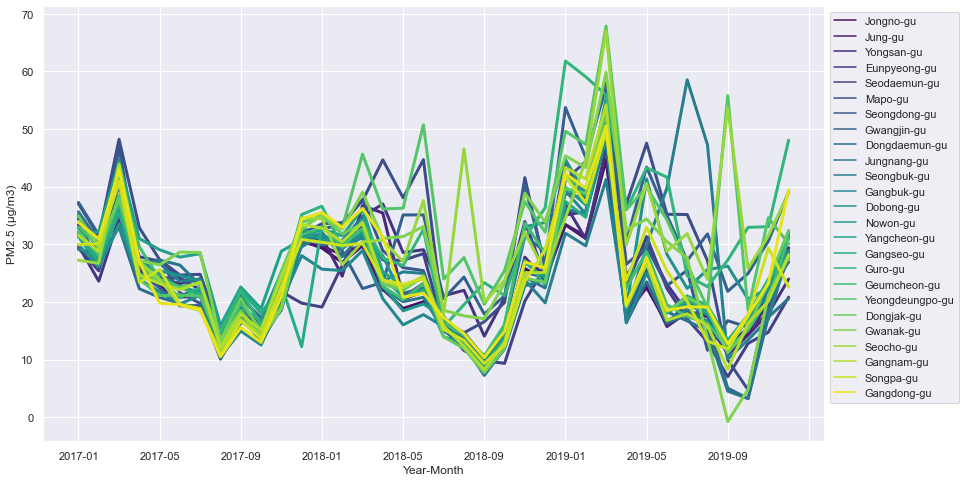

In [9]:
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(14,8)})

ax = sns.lineplot(data=df_monthly, x ='YM', y = 'PM2.5',
                  hue='District', palette='viridis',
                  legend='full', lw=3)

ax.xaxis.set_major_locator(ticker.MultipleLocator(4))
plt.legend(bbox_to_anchor=(1, 1))
plt.ylabel('PM2.5 (µg/m3)')
plt.xlabel('Year-Month')
plt.show()

Las líneas superpuestas son difíciles de leer. En 2017, se puede ver que la cantidad de PM2.5 en muchas estaciones fue en la misma dirección. Sin embargo, en 2018 y 2019, las líneas de contaminación fueron arbitrarias y es difícil distinguirlas.

Ideas de visualización
El objetivo principal de este artículo es guiar con algunas ideas de visualización con Python para manejar múltiples datos de series temporales, con énfasis en resolver el problema de los gráficos superpuestos, ya que es un problema principal en el gráfico de múltiples datos de series temporales, como ya hemos visto.

Cada gráfico tiene sus pros y sus contras. Obviamente, nada es perfecto. Algunos pueden ser solo para un efecto llamativo. Pero todos ellos tienen el mismo propósito de comparar secuencias entre categorías.



## 2. Mismo gráfico haciendo interactivo el trazado. 

Plotly es una biblioteca gráfica para hacer gráficos interactivos. El gráfico interactivo ayuda a focalizar sobre el área con líneas superpuestas.

In [10]:
import plotly.graph_objects as go

#extract color palette, the palette can be changed
pal = list(sns.color_palette(palette='viridis', n_colors=len(list_scode)).as_hex())

fig = go.Figure()
for d,p in zip(list_district, pal):
    fig.add_trace(go.Scatter(x = df_monthly[df_monthly['District']==d]['YM'],
                             y = df_monthly[df_monthly['District']==d]['PM2.5'],
                             name = d,
                             line_color = p, 
                             fill=None))   #tozeroy 

fig.show()

## 3- Ahora hacemos un gráfico de area interactivo con  Plotly.

In [11]:
fig = go.Figure()
for d,p in zip(list_district, pal):
    fig.add_trace(go.Scatter(x = df_monthly[df_monthly['District']==d]['YM'],
                             y = df_monthly[df_monthly['District']==d]['PM2.5'],
                             name = d,
                             line_color = p, 
                             fill='tozeroy'))   #tozeroy 

fig.show()

## 4. Comparando uno a uno con Small Multiple Time Series.

Con la biblioteca Seaborn, podemos hacer pequeñas series temporales múltiples. La idea detrás de estos gráficos es trazar cada línea una por una mientras las compara con la silueta de las otras líneas. 

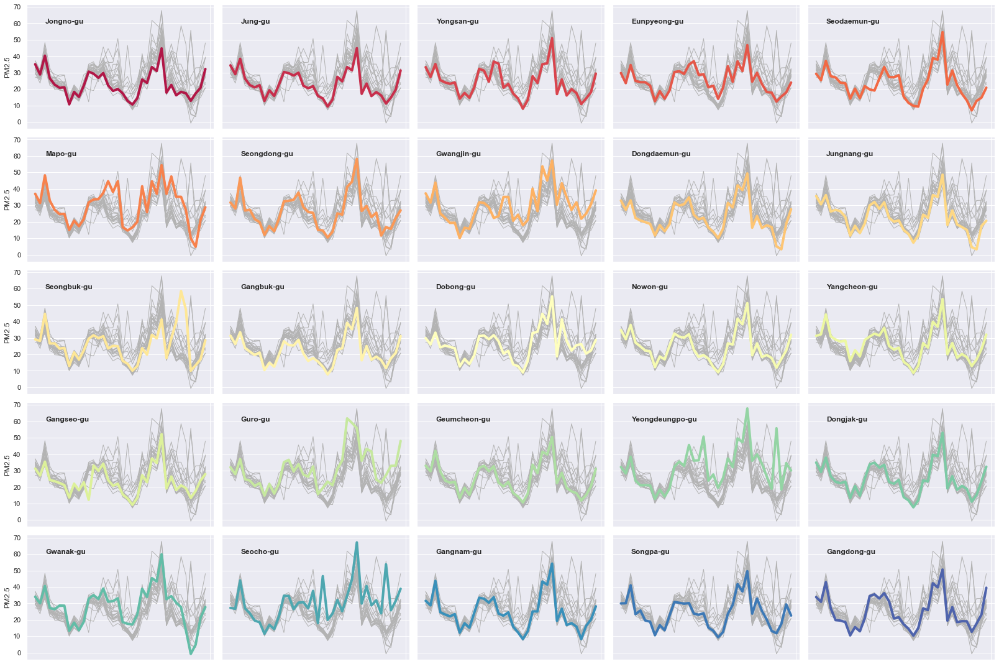

In [12]:
g = sns.relplot(data = df_monthly, x = "YM", y = "PM2.5",
                col = "District", hue = "District",
                kind = "line", palette = "Spectral",   
                linewidth = 4, zorder = 5,
                col_wrap = 5, height = 3, aspect = 1.5, legend = False
               )

#add text and silhouettes
for time, ax in g.axes_dict.items():
    ax.text(.1, .85, time,
            transform = ax.transAxes, fontweight="bold"
           )
    sns.lineplot(data = df_monthly, x = "YM", y = "PM2.5", units="District",
                 estimator = None, color= ".7", linewidth=1, ax=ax
                )

ax.set_xticks('')
g.set_titles("")
g.set_axis_labels("", "PM2.5")
g.tight_layout()

## Cambiar el punto de vista con Facet Grid

FacetGrid de Seaborn se puede utilizar para crear cuadrículas de varias parcelas. En este caso, los atributos 'Mes' y 'Año' se configuran como filas y columnas, respectivamente. Desde otra perspectiva, los valores se pueden comparar simultáneamente mensualmente en vertical y anualmente en horizontal.

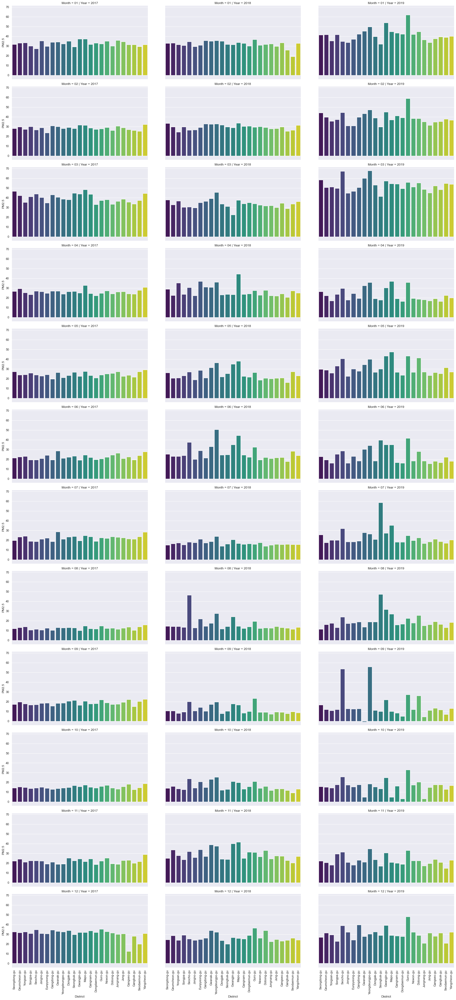

In [13]:
g = sns.FacetGrid(df_monthly, col="Year", row="Month", height=4.2, aspect=1.9)
g = g.map(sns.barplot, 'District', 'PM2.5', palette='viridis', ci=None, order = list_district)

g.set_xticklabels(rotation = 90)
plt.show()


## Usar color con un Heat Map

Un mapa de calor representa los datos en un gráfico bidimensional que muestra los valores en colores. Para manejar los datos de la serie temporal, podemos configurar los grupos en la vertical y la línea de tiempo en las dimensiones horizontales. La diferencia de color ayuda a distinguir entre grupos.

In [14]:
df_pivot = pd.pivot_table(df_monthly,
                          values='PM2.5',
                          index='District',
                          columns='YM')
df_pivot

YM,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,...,2019-03,2019-04,2019-05,2019-06,2019-07,2019-08,2019-09,2019-10,2019-11,2019-12
District,,,,,,,,,,,,,,,,,,,,,
Dobong-gu,29.938172,26.101190,33.245968,24.245833,25.389785,24.570833,23.674731,12.673387,17.268056,14.159946,...,55.300766,18.795549,41.342898,28.261111,22.337483,25.601648,26.211656,20.478495,22.380556,28.894809
Dongdaemun-gu,32.892473,27.238095,32.967742,22.276389,20.774194,19.733333,18.737903,11.646505,17.954167,14.250000,...,49.373563,16.368567,23.486370,16.206944,17.882434,16.701351,5.029141,3.223118,18.748611,27.607923
Dongjak-gu,34.952957,29.187500,37.931452,26.590278,23.169355,22.398611,23.310484,13.271505,20.622222,14.750000,...,53.065134,19.164117,26.606887,18.375000,20.756570,18.861644,11.150307,15.267473,23.637500,32.411202
Eunpyeong-gu,29.771505,23.595238,34.607527,24.941667,24.189516,24.125000,22.129032,12.572581,18.712500,14.106183,...,46.705545,24.499305,29.926829,23.079167,18.219917,17.824897,12.380368,15.455645,17.930556,23.964481
Gangbuk-gu,31.387097,26.311012,33.530914,23.969444,21.713710,19.647222,21.142473,10.440860,14.944444,12.534946,...,48.159004,16.389430,25.091822,16.687500,18.677732,16.542582,11.670245,17.536290,20.952778,31.173497
Gangdong-gu,33.797043,30.922619,42.892473,27.000000,19.787634,19.504167,18.595430,10.498656,15.556944,12.981183,...,50.542146,19.477051,27.668580,18.529167,19.156293,19.087838,12.699387,17.689516,23.179167,39.494536
Gangnam-gu,31.529570,28.763393,43.662634,24.643056,23.193548,22.076389,23.450269,12.126344,17.863889,15.145161,...,54.191571,19.324061,26.741750,16.805556,17.944675,15.898649,8.274540,16.293011,20.120833,28.166667
Gangseo-gu,31.284946,27.037202,35.482527,24.338889,23.581989,22.508333,21.232527,13.684140,22.069444,18.051075,...,52.208413,19.152990,26.460545,18.179167,21.027663,19.367072,13.357362,17.668011,23.962500,27.913934
Geumcheon-gu,33.009409,29.656250,42.028226,29.568056,23.959677,22.655556,23.217742,13.178763,19.681944,15.272849,...,50.526820,22.385257,28.734577,19.497222,17.432918,16.335135,11.828221,15.133065,20.475000,31.133880


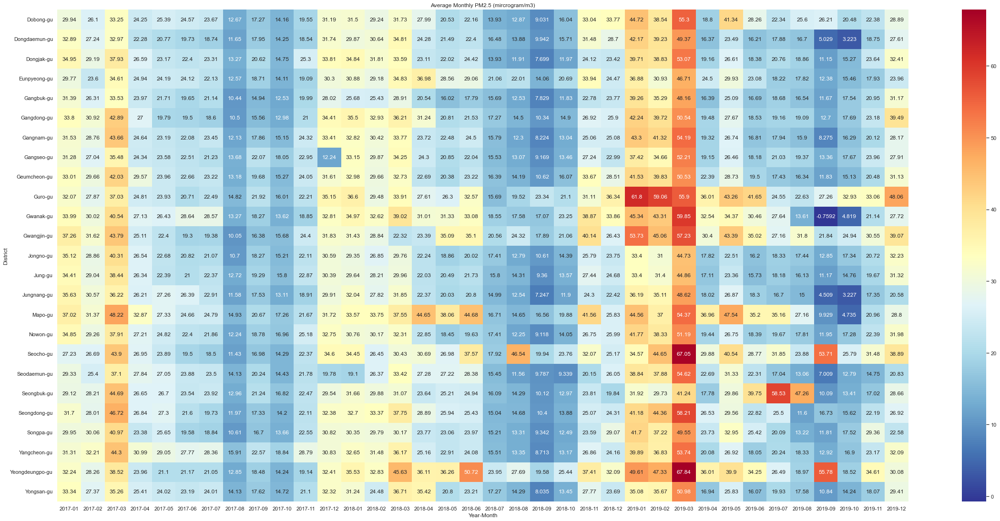

In [15]:

plt.figure(figsize = (40,19))
plt.title('Average Monthly PM2.5 (mircrogram/m3)')

sns.heatmap(df_pivot, annot=True, cmap='RdYlBu_r', fmt= '.4g',)
plt.xlabel('Year-Month')
plt.ylabel('District')
plt.show()



## Aplicación de ángulos con un gráfico de radar

Podemos establecer el eje angular en el diagrama de dispersión en Plotly para crear un gráfico de radar interactivo. Cada mes se seleccionará como una variable en el círculo. Por ejemplo, en este ejemplo, crearemos un gráfico de radar que compare el promedio mensual de PM2.5 de los 25 distritos en 2019.

Filtre el DataFrame con solo datos de 2019

In [16]:
df_19 = df_monthly[df_monthly['Year']=='2019']

In [17]:
import plotly.graph_objects as go

#extract color palette, the palette name can be changed
pal = list(sns.color_palette(palette='viridis', n_colors=len(list_scode)).as_hex())

months = list(reversed([str(i) for i in list(range(1,13))])) + ['12']
list_PM = [[list(df_19[df_19['District']==i]['PM2.5'])[int(n)-1] for n in months] for i in list_district]

fig = go.Figure()
for pm,d,c in zip(list_PM, list_district, pal):
    fig.add_trace(go.Scatterpolar(r = pm, theta=months, fill= None,
                                  name=str(d), marker = dict(color = c)))

fig.update_layout(polar = dict(radialaxis = dict(visible = True, range=[0, 70]),
                               angularaxis = dict(rotation=90)),
                  showlegend=True, width=720, height=720,
                  font = dict(size=14))

fig.show()

Vayamos más allá llenando el área de radar de cada uno de los distritos, de a uno y comparando cada uno con el resto. Luego crea un collage de fotos.

In [18]:
keep_figname = []
for i in list_district:
    fig = go.Figure()
    for d, pm, c in zip(list_district, list_PM, pal):
        
        # fill radar chart by name of district
        if i == d:
            fig.add_trace(go.Scatterpolar(r = pm, theta=months, fill='toself',
                                          name=str(d), marker = dict(color = c)))
        else:
            fig.add_trace(go.Scatterpolar(r = pm, theta=months, fill= None,
                                          name=str(d), marker = dict(color = c)))
    #update layout
    fig.update_layout(polar = dict(radialaxis = dict(visible = True, range=[0, 70]),
                                   angularaxis = dict(rotation=90)),
                      showlegend = True, width = 720, height = 720,
                      font = dict(size = 14), title = i, title_x = 0.5)
    
    keep_figname.append('radar_'+ i + '.png')
    fig.write_image('radar_'+ i + '.png')   #export_fig
    fig.show()

Defina una función para crear un collage de fotos.

In [19]:
from PIL import Image
def get_collage(cols_n, rows_n, width, height, input_sname, save_name):
    c_width = width//cols_n
    c_height = height//rows_n
    size = c_width, c_height
    new_im = Image.new('RGB', (width, height))
    ims = []
    for p in input_sname:
        im = Image.open(p)
        im.thumbnail(size)
        ims.append(im)
    i, x, y = 0,0,0
    for col in range(cols_n):
        for row in range(rows_n):
            print(i, x, y)
            new_im.paste(ims[i], (x, y))
            i += 1
            y += c_height
        x += c_width
        y = 0
    new_im.save(save_name)

Use the function

In [20]:
# to create a fit photo collage: 
# width = number of columns * figure size // height = number of rows * figure size  

get_collage(5, 5, 3600, 3600, keep_figname, 'Collage_radar.jpg')

0 0 0
1 0 720
2 0 1440
3 0 2160
4 0 2880
5 720 0
6 720 720
7 720 1440
8 720 2160
9 720 2880
10 1440 0
11 1440 720
12 1440 1440
13 1440 2160
14 1440 2880
15 2160 0
16 2160 720
17 2160 1440
18 2160 2160
19 2160 2880
20 2880 0
21 2880 720
22 2880 1440
23 2880 2160
24 2880 2880


## Veamos el diagrama de barras con Circular Bar Plot (Race Track Plot)

El concepto de una Gráfica de Barra Circular (también conocida como Gráfica de Pista de Carrera) es tan simple porque son solo gráficas de barra en un círculo. Podemos graficar Circular Bar Plot mensualmente y luego hacer un collage de fotos para comparar el proceso a lo largo del tiempo. La desventaja de este gráfico es que es difícil comparar entre categorías. Por cierto, es una buena opción para llamar la atención con un efecto llamativo.

Definir una función para crear un diagrama de barra circular

In [21]:
max_val = max(df_19['PM2.5'])*1.001        #set max value
pal = list(sns.color_palette(palette='YlOrRd', n_colors=len(list_district)).as_hex())

def circular_bar(input_df, column_name, title):
    plt.gcf().set_size_inches(12, 12)
    ax = plt.subplot(projection='polar')
    input_df.reset_index(inplace=True, drop=True)
    for i in range(len(input_df)):
        ax.barh(i, input_df[column_name][i]*2*np.pi/max_val, label=input_df['District'][i], color=pal[i])

    ax.set_theta_zero_location('N')
    ax.set_theta_direction(1)
    ax.set_rlabel_position(0)
    ax.set_thetagrids([], labels=[])
    ax.set_rgrids(range(len(input_df)), labels= input_df['District'])

    ax = plt.subplot(projection='polar')
    plt.title("Average PM2.5 // " + title)
    return ax

Aplicar la funcion

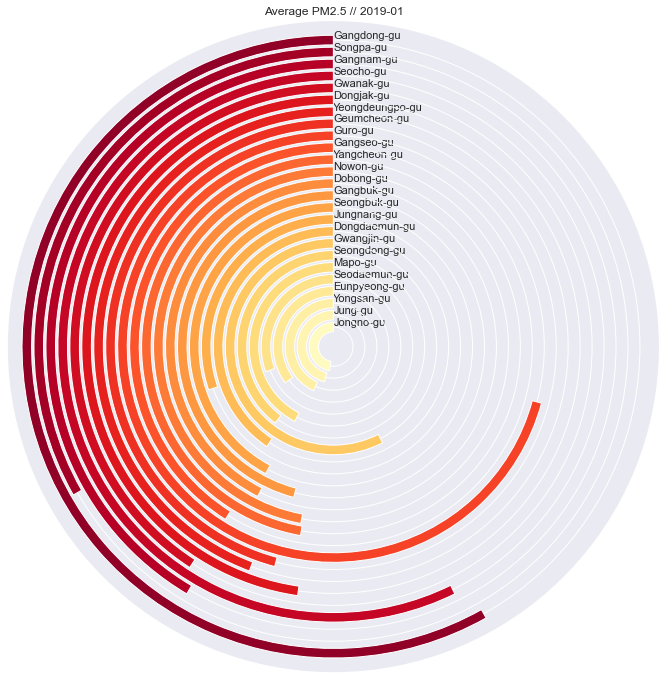

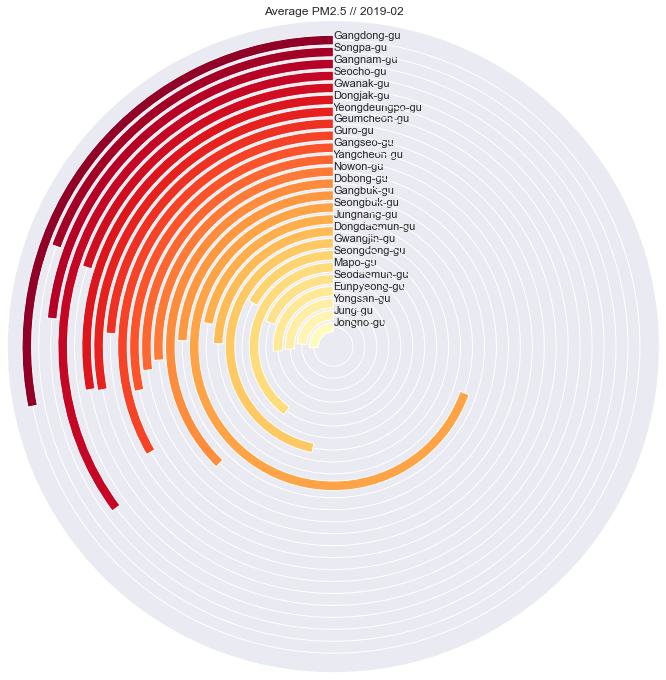

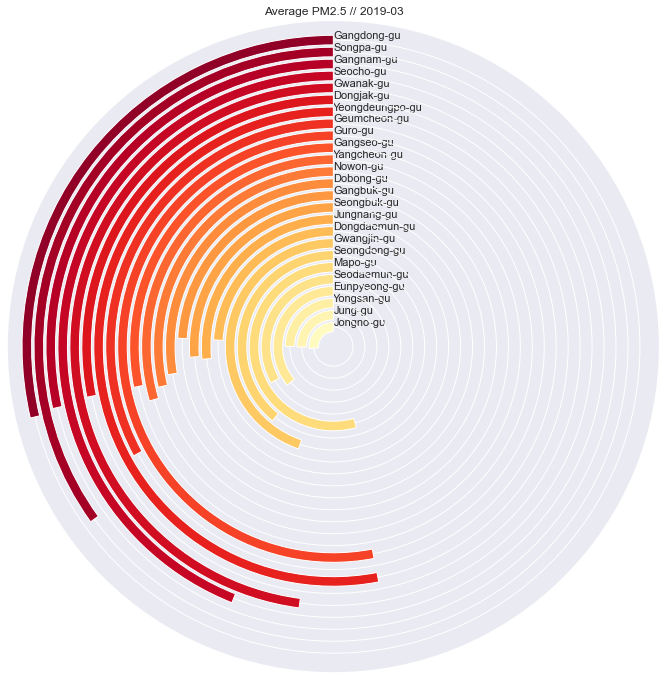

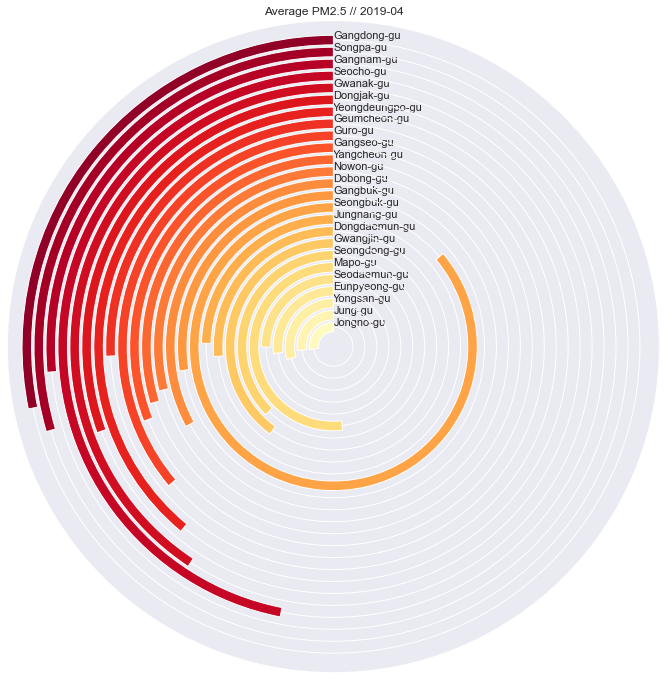

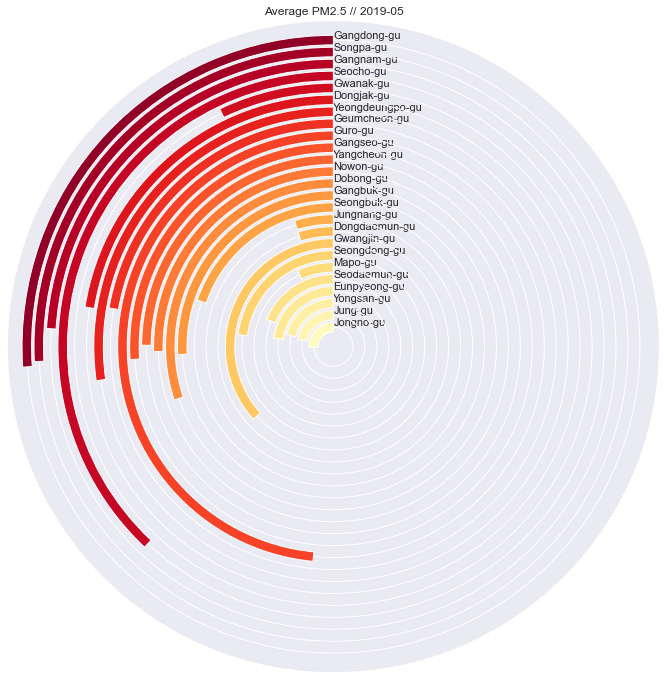

...

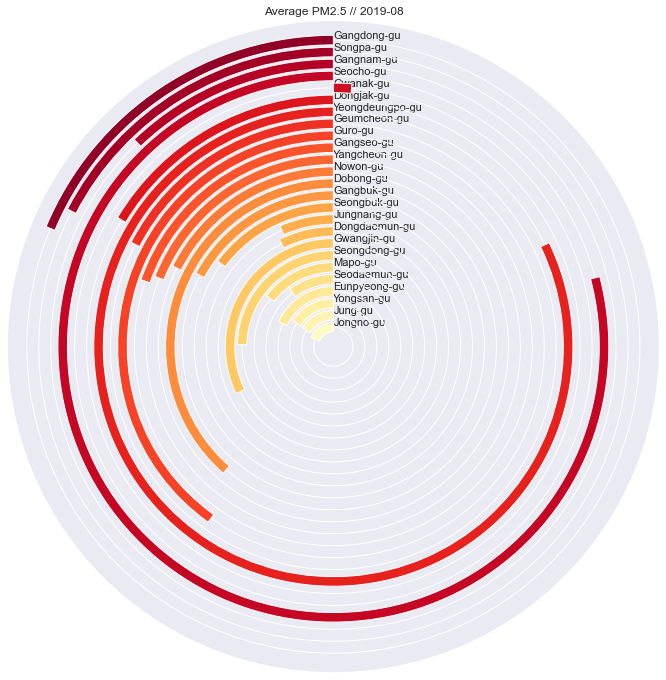

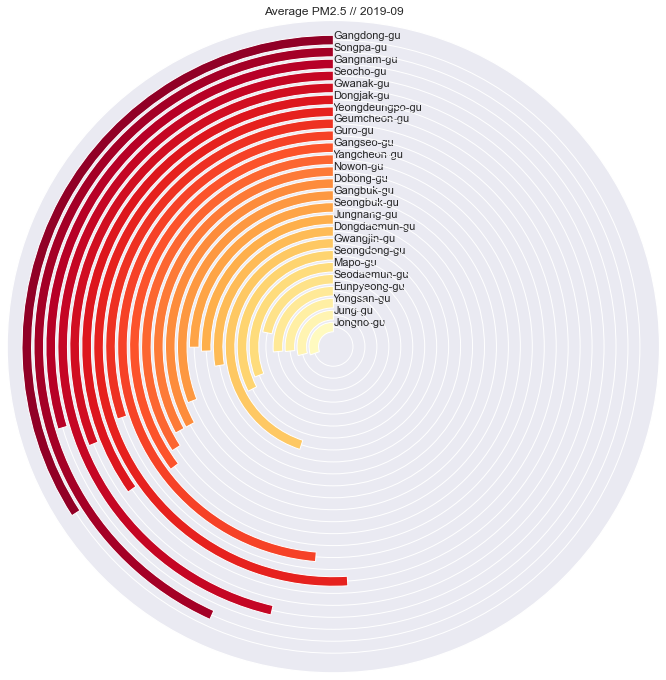

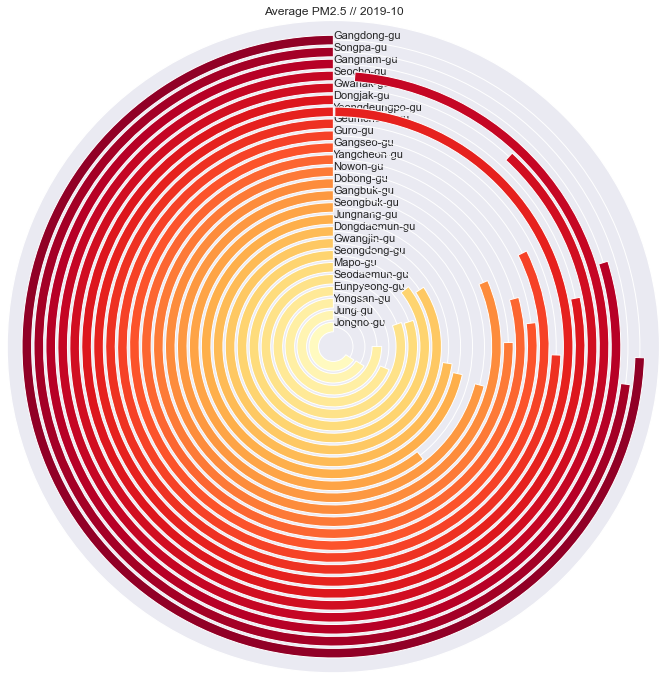

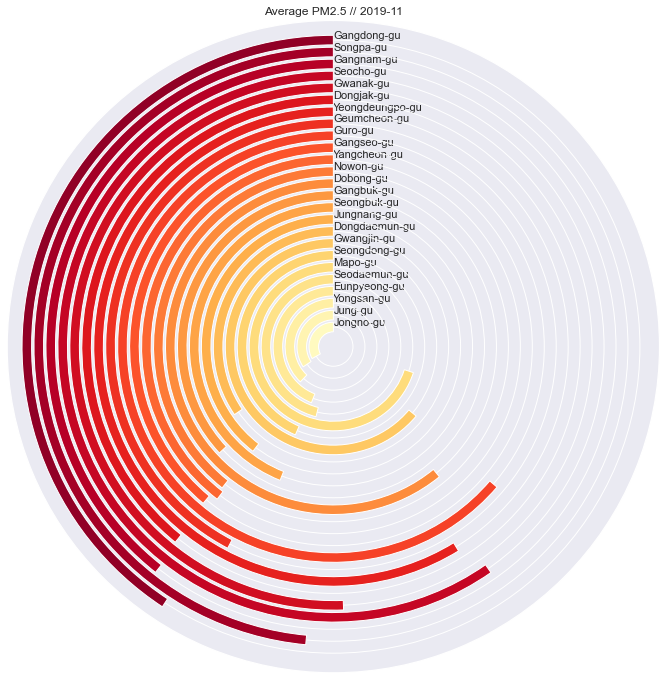

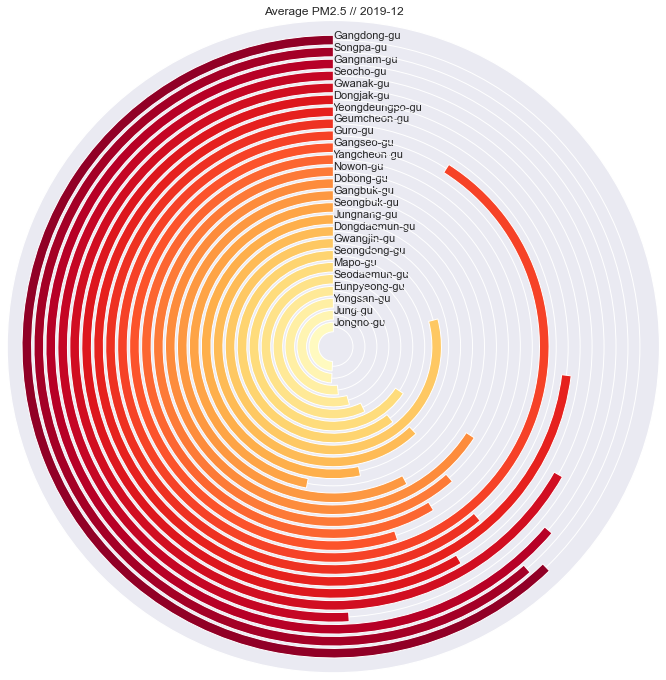

In [22]:
list_month19 = list(set(df_19['Month']))
list_YM19 = list(set(df_19['YM']))
list_YM19.sort()
listdf_monthly19 = [df_19[df_19['Month']==str(i)] for i in list_month19]

keep_sname = []
order = range(len(listdf_monthly19))
for i in order:
    circular_bar(listdf_monthly19[i],'PM2.5', list_YM19[i])
    #keep_sname.append('cir_bar_' + str(i) + '.png')
    #plt.savefig('cir_bar_' + str(i) + '.png')
    plt.show()

Crear el collage

In [ ]:
# to create a fit photo collage: 
# width = number of columns * figure size // height = number of rows * figure size   

get_collage(3, 4, 2592, 3456, keep_sname, 'Collage_cir_bar.jpg')


##  Comenzando desde el centro con Radial Plot

Al igual que el gráfico de barras circular, el gráfico radial se basa en gráficos de barras que utilizan coordenadas polares en lugar de coordenadas cartesianas. Este tipo de gráfico es inconveniente cuando se comparan categorías ubicadas lejos unas de otras, pero es una excelente opción para llamar la atención. Se puede utilizar en infografías.



In [ ]:
#set color palette, lower and max values 
pal = list(sns.color_palette(palette='CMRmap_r', n_colors=len(list_district)).as_hex())
lowerLimit = 0
max_v = df_19['PM2.5'].max()

def radial_plot(input_df, column_name, title):
    input_df.reset_index(inplace=True, drop=True)
    plt.figure(figsize=(12,12))
    ax = plt.subplot(111, polar=True)
    plt.axis()

    heights = input_df[column_name]
    width = 2*np.pi / len(input_df.index)

    indexes = list(range(1, len(input_df.index)+1))
    angles = [element * width for element in indexes]

    bars = ax.bar(x=angles, height=heights, width=width, bottom=lowerLimit,
                  linewidth=1, edgecolor="white", color=pal)
    
    labelPadding = 2

    for bar, angle, height, label in zip(bars, angles, heights, list_district):
        rotation = np.rad2deg(angle)
        alignment = ""
      
        if angle >= np.pi/2 and angle < 3*np.pi/2:
            alignment = "right"
            rotation = rotation + 180
        else: 
            alignment = "left"

        ax.text(x=angle, y=lowerLimit + bar.get_height() + labelPadding,
                s=label, ha=alignment, va='center', rotation=rotation, 
                rotation_mode="anchor")
    
        ax.set_thetagrids([], labels=[])
        plt.title("Average PM2.5 // " + title)
    return ax

Aplicar la funcion

In [ ]:
keep_sname = []
order = range(len(listdf_monthly19))

for i in order:
    radial_plot(listdf_monthly19[i], 'PM2.5', list_YM19[i])
    keep_sname.append('rad_bar_' + str(i) + '.png')
    plt.savefig('rad_bar_' + str(i) + '.png')
    plt.show()

Photo collage necesita descomentar las lineas de grabado de imagenes

In [ ]:
# to create a fit photo collage: 
# width = number of columns * figure size // height = number of rows * figure size  

#get_collage(3, 4, 2592, 3456, keep_sname, 'Collage_rad_bar.png')

##  Mostrando densidades superpuestas (Gráfico de cresta)

Las densidades superpuestas (Gráfico de cresta) se pueden usar con múltiples datos de series de tiempo configurando un eje como una línea de tiempo. Al igual que el diagrama de barra circular y el diagrama radial, el diagrama de cresta puede llamar la atención de las personas. 

La siguiente imagen muestra un ejemplo del gráfico Ridge con las densidades de PM2.5 en un distrito en 2019.

Defina una función para crear el gráfico Ridge



In [23]:
#change color scale for 12 months
pal = list(sns.color_palette(palette='viridis', n_colors=len(list_month19)).as_hex())

def kde_ridge(df_input, col_name, time, title):
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

    # Initialize the FacetGrid object
    g = sns.FacetGrid(df_input, row= time, hue=time, aspect=15, height=0.65, palette=pal)

    # Draw the densities in a few steps
    g.map(sns.kdeplot, col_name,
          bw_adjust=.5, clip_on=False,fill=True, alpha=1, linewidth=1.5)

    g.map(sns.kdeplot, col_name, clip_on=False, color="w", lw=2, bw_adjust=.5)

    # passing color=None to refline() uses the hue mapping
    g.map(plt.axhline, y=0, linewidth=2, linestyle="-", color=None, clip_on=False)
    
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .2, label, fontweight="bold", color=color,ha="left", va="center", transform=ax.transAxes)
    
    g.map(label, time)

    # Set the subplots to overlap
    g.fig.subplots_adjust(hspace=-.25)

    # Remove axes details that don't play well with overlap
    g.set_titles("")
    g.set(yticks=[], ylabel="", xlabel= title + ' PM2.5')
    g.despine(bottom=True, left=True)

    return g

Apliquemos la funcion

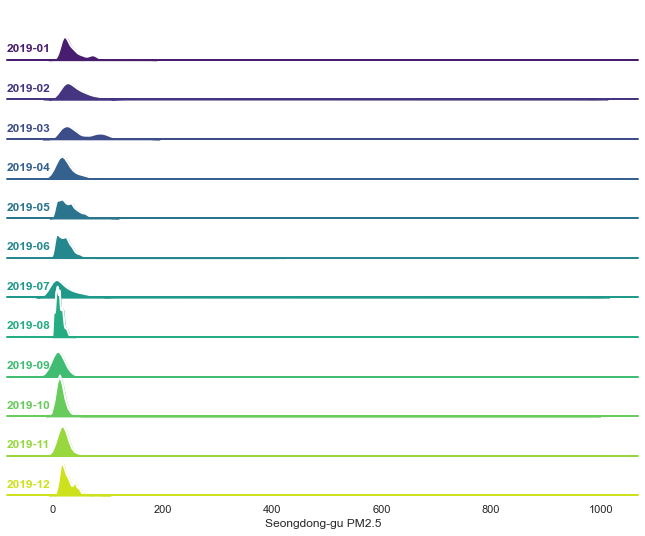

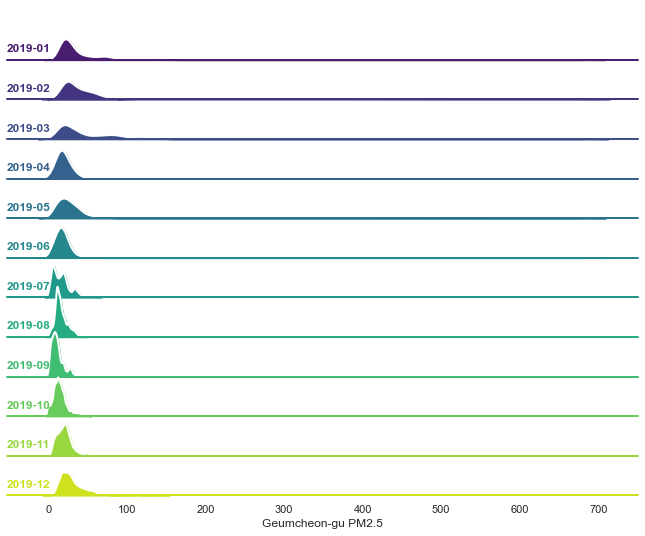

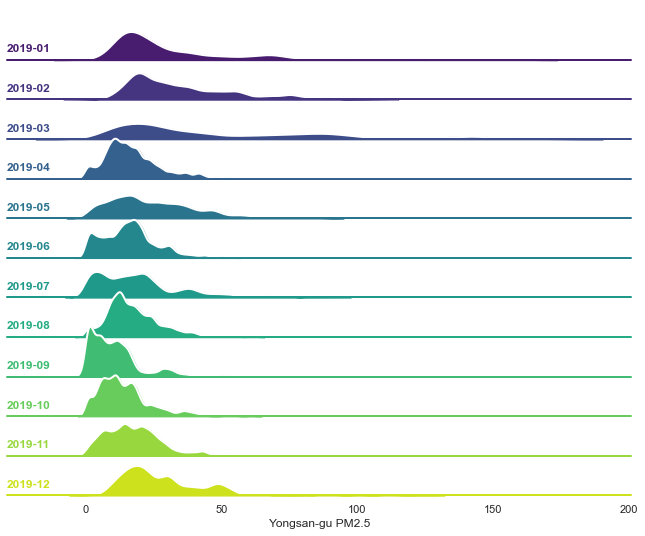

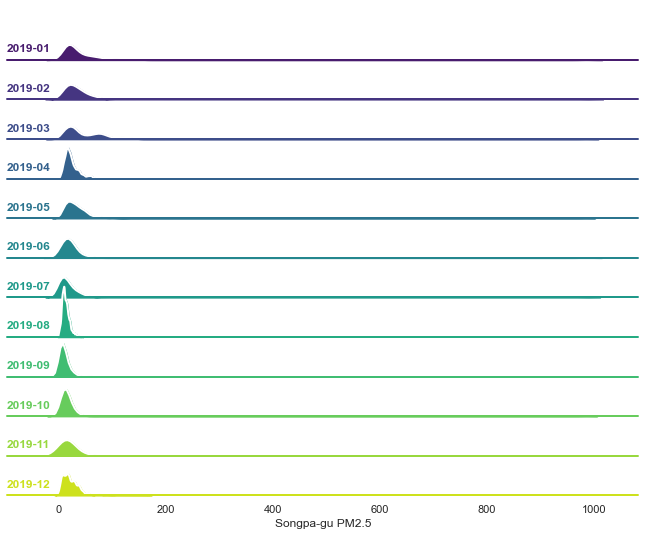

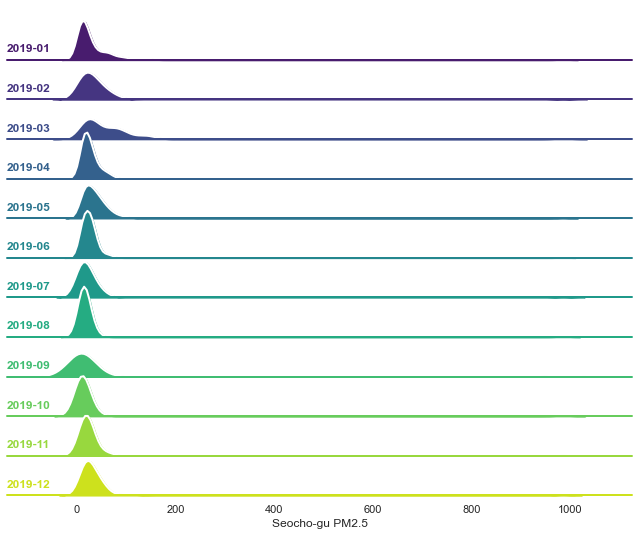

...

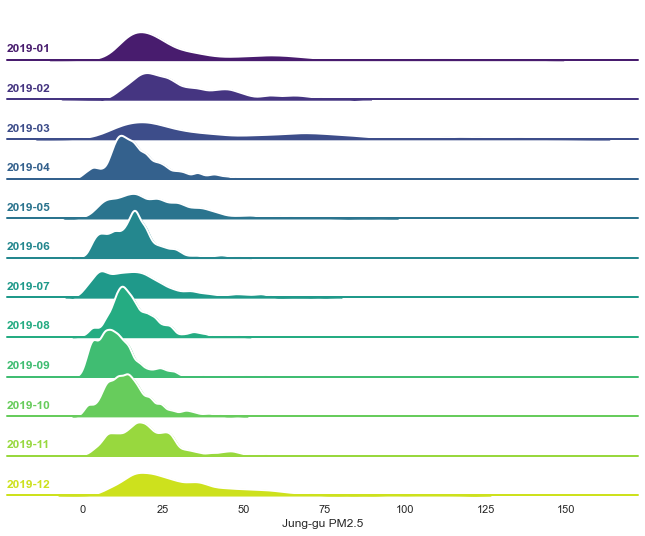

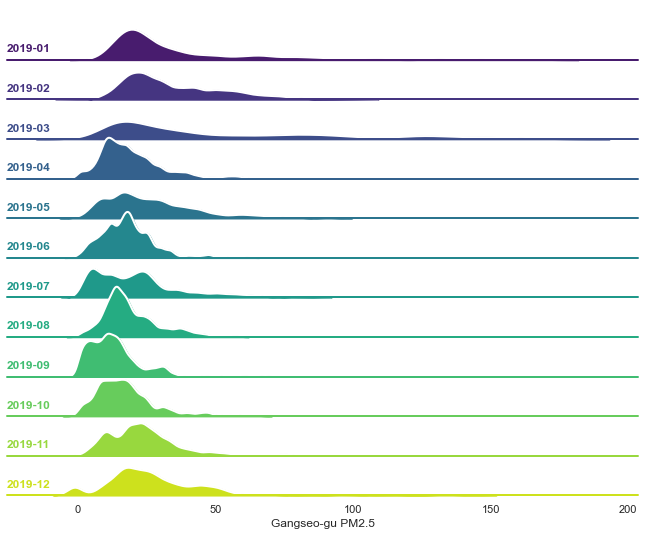

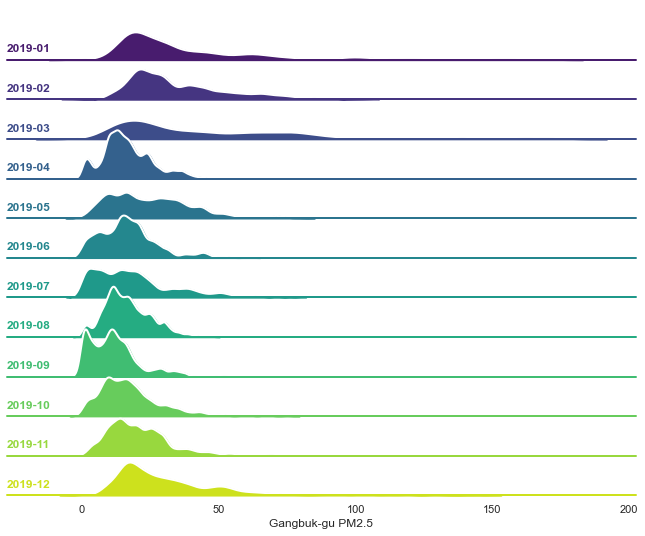

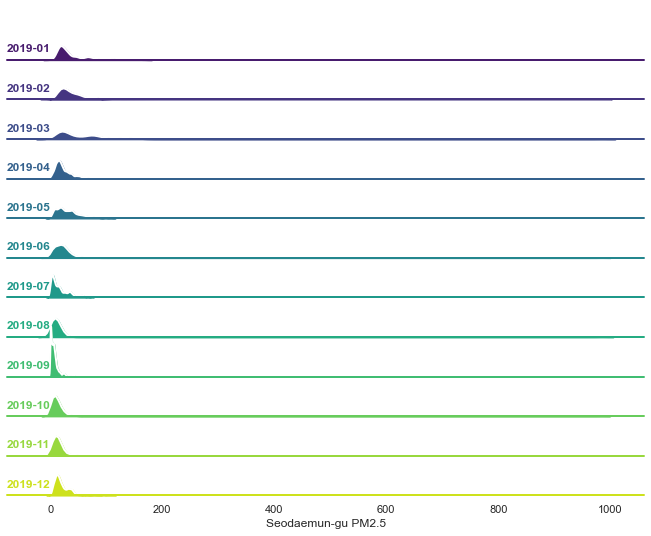

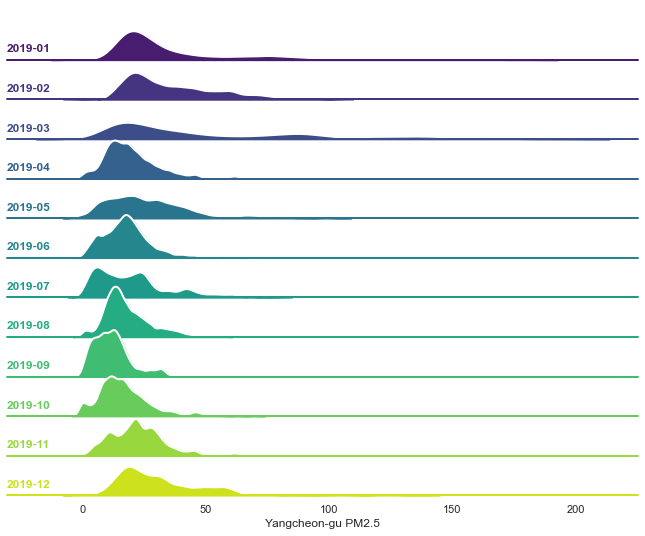

In [24]:
#use hourly data
df_hour19 = df[df['Year']=='2019'] 
df_hd19 = [df_hour19[df_hour19['District']==i] for i in list_district]

keep_sname = []
order = range(len(list_district))
for i in order:
    kde_ridge(df_hd19[i], 'PM2.5', 'YM', list_district[i])
    keep_sname.append('kde_' + str(i) + '.png')
   # plt.savefig('kde_' + str(i) + '.png')
    plt.show()

Create photo collage

In [ ]:
# to create a fit photo collage: 
# width = number of columns * figure size // height = number of rows * figure size  

#get_collage(5, 5, 3510, 2805, keep_sname, 'Collage_kde_ridge.jpg')


## Resumen
estos ejemplos muestran algunas visualizaciones con ejemplos de código de Python para manejar líneas superpuestas en el gráfico de varias series de tiempo. Los dos conceptos principales son usar tramas interactivas y separarlas. El gráfico interactivo es útil con opciones que permiten a los usuarios seleccionar categorías libremente, mientras que separar los gráficos ayuda a los usuarios a compararlos fácilmente.
